<a href="https://colab.research.google.com/github/chrisanabelkhaw/capstoneproject/blob/main/StyleGAN2_x_DiffAugment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Setup Environment

In [ ]:
%cd /content
!git clone https://github.com/mit-han-lab/data-efficient-gans
%mkdir dataset


/content
Cloning into 'data-efficient-gans'...
remote: Enumerating objects: 721, done.
remote: Counting objects: 100% (135/135), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 721 (delta 110), reused 110 (delta 107), pack-reused 586
Receiving objects: 100% (721/721), 34.75 MiB | 28.01 MiB/s, done.
Resolving deltas: 100% (385/385), done.


Scrap images from Instagram 

In [ ]:
!pip install instagram-scraper


In [ ]:
%cd /content/dataset
!instagram-scraper -m 110 streetart_official -u <username> -p <password> 
!--media-types posts-image

/content/dataset
Searching streetart_official for profile pic: 100% 1/1 [00:00<00:00, 2647.92 images/s]
Searching streetart_official for stories: 100%|##########| 100/100 [00:00<00:00, 9114.88 media/s]
Searching streetart_official for posts: 109 media [00:10, 10.21 media/s]
Downloading: 100%|##########| 211/211 [00:11<00:00, 18.93it/s]
/bin/bash: --: invalid option
Usage:	/bin/bash [GNU long option] [option] ...
	/bin/bash [GNU long option] [option] script-file ...
GNU long options:
	--debug
	--debugger
	--dump-po-strings
	--dump-strings
	--help
	--init-file
	--login
	--noediting
	--noprofile
	--norc
	--posix
	--rcfile
	--restricted
	--verbose
	--version
Shell options:
	-ilrsD or -c command or -O shopt_option		(invocation only)
	-abefhkmnptuvxBCHP or -o option


In [ ]:
%cd /content/dataset
!pwd
#automating creating a new file 
%rm -rf data_cleaned
%mkdir data_cleaned

/content/dataset
/content/dataset


In [ ]:
#resizing to (power-of-two: requirement of .tfrecords format) so as to standardise the photos to be saved in a new folder 
%cd /content/dataset/streetart_official

import os, os.path 
from pathlib import Path 
from PIL import Image


original_path = "/content/dataset/streetart_official"
new_path = Path("/content/dataset/data_cleaned")

for file in os.listdir(original_path):  
   #igore files that are videos 
    #file = str(file)
    #print(file)
    video = "mp4"
    if video in file: 
      continue  
    else: 
      pass
  
    
    # Opens a image in RGB mode
    image = Image.open(file)
    
    #resize the image 
    new_image = image.resize((128,128))

    #show the image in image viewer
    new_image.show()

    #save the image in a new folder 
    new_image.save(str(new_path/file), 'JPEG')

/content/dataset/streetart_official


2. Go to the DiffAugment-stylegan2 folder:

In [ ]:
%cd /content/data-efficient-gans/DiffAugment-stylegan2

/content/data-efficient-gans/DiffAugment-stylegan2


3. Prepare the preliminaries and define some functions for later uses:

In [ ]:
!pip uninstall -y tensorflow tensorflow-probability
!pip install tensorflow-gpu==1.15.0 tensorflow-datasets==2.1.0

import tensorflow as tf
import os
import numpy as np
import PIL
import IPython
from multiprocessing import Pool
import matplotlib.pyplot as plt

from dnnlib import tflib, EasyDict
from training import misc, dataset_tool
from metrics import metric_base
from metrics.metric_defaults import metric_defaults

def _generate(network_name, num_rows, num_cols, seed, resolution):
  if seed is not None:
    np.random.seed(seed)
  with tf.Session():
    _, _, Gs = misc.load_pkl(network_name)
    z = np.random.randn(num_rows * num_cols, Gs.input_shape[1])
    outputs = Gs.run(z, None, output_transform=dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True))
    outputs = np.reshape(outputs, [num_rows, num_cols, *outputs.shape[1:]])
    outputs = np.concatenate(outputs, axis=1)
    outputs = np.concatenate(outputs, axis=1)
    img = PIL.Image.fromarray(outputs)
    img = img.resize((resolution * num_cols, resolution * num_rows), PIL.Image.ANTIALIAS)
  return img

def generate(network_name, num_rows, num_cols, seed=None, resolution=128):
  with Pool(1) as pool:
    return pool.apply(_generate, (network_name, num_rows, num_cols, seed, resolution))

def _evaluate(network_name, dataset, resolution, metric):
  dataset = dataset_tool.create_dataset(dataset, resolution)
  dataset_args = EasyDict(tfrecord_dir=dataset, resolution=resolution, from_tfrecords=True)
  metric_group = metric_base.MetricGroup([metric_defaults[metric]])
  metric_group.run(network_name, dataset_args=dataset_args, log_results=False)
  return metric_group.metrics[0]._results[0].value

def evaluate(network_name, dataset, resolution=256, metric='fid5k-train'):
  with Pool(1) as pool:
    return pool.apply(_evaluate, (network_name, dataset, resolution, metric))

Found existing installation: tensorflow 2.7.0
Uninstalling tensorflow-2.7.0:
  Successfully uninstalled tensorflow-2.7.0
Found existing installation: tensorflow-probability 0.15.0
Uninstalling tensorflow-probability-0.15.0:
  Successfully uninstalled tensorflow-probability-0.15.0
     |████████████████████████████████| 411.5 MB 7.9 kB/s 
     |████████████████████████████████| 3.1 MB 25.4 MB/s 
     |████████████████████████████████| 50 kB 5.5 MB/s 
     |████████████████████████████████| 3.8 MB 15.1 MB/s 
     |████████████████████████████████| 503 kB 43.8 MB/s 
  Created wheel for gast: filename=gast-0.2.2-py3-none-any.whl size=7554 sha256=da81d746aae8451b694d076aee7fd66affcb37fd5bd7dd06b879307ae9a6f9d8
  Stored in directory: /root/.cache/pip/wheels/21/7f/02/420f32a803f7d0967b48dd823da3f558c5166991bfd204eef3
Successfully built gast
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.7.0
    Uninstalling tensorflow-estimator-2.7.0:
    

## Training with 100 Images


In [ ]:
%cd /content/data-efficient-gans/DiffAugment-stylegan2

/content/data-efficient-gans/DiffAugment-stylegan2


In [ ]:
%cd /content/data-efficient-gans/DiffAugment-stylegan2
!python3 run_low_shot.py --dataset=../../dataset/data_cleaned --resolution=64

/content/data-efficient-gans/DiffAugment-stylegan2
Loading images from "../../dataset/data_cleaned"
Creating dataset "../../dataset/data_cleaned"
Added 231 images.
Local submit - run_dir: results/00000-DiffAugment-stylegan2-data_cleaned-64-batch16-1gpu-color-translation-cutout
dnnlib: Running training.training_loop.training_loop() on localhost...
Streaming data using training.dataset.TFRecordDataset...
Dataset shape = [3, 64, 64]
Dynamic range = [0, 255]
Label size    = 0
Constructing networks...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Compiling... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Compiling... Loading... Done.

G                           Params    OutputShape       WeightShape     
---                         ---       ---               ---             
latents_in                  -         (?, 512)          -               
labels_in                   -         (?,)              -               
lod            

Generate the images 

In [ ]:
%tensorflow_version 1.x


!nvidia-smi

TensorFlow is already loaded. Please restart the runtime to change versions.
Mon Dec  6 11:24:55 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P0    46W / 250W |      0MiB / 16280MiB |     48%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
           

In [ ]:
%cd /content
!git clone https://github.com/NVlabs/stylegan2-ada.git
project_path = "/content/StyleGAN2-ADA"

%cd /content
%rm -rf StyleGAN2-ADA
%mkdir StyleGAN2-ADA
%cd /content/StyleGAN2-ADA

In [ ]:
%cd /content/stylegan2-ada
%pip install opensimplex
!python generate.py generate-images --help 

/content/stylegan2-ada
usage: generate.py [-h] --network NETWORK_PKL
                   (--seeds SEEDS | --dlatents DLATENTS_NPZ)
                   [--trunc TRUNCATION_PSI] [--class CLASS_IDX] --outdir DIR

Generate images using pretrained network pickle.

optional arguments:
  -h, --help            show this help message and exit
  --network NETWORK_PKL
                        Network pickle filename
  --seeds SEEDS         List of random seeds
  --dlatents DLATENTS_NPZ
                        Generate images for saved dlatents
  --trunc TRUNCATION_PSI
                        Truncation psi (default: 0.5)
  --class CLASS_IDX     Class label (default: unconditional)
  --outdir DIR          Where to save the output images

examples:

  # Generate curated MetFaces images without truncation (Fig.10 left)
  python generate.py --outdir=out --trunc=1 --seeds=85,265,297,849 \
      --network=https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada/pretrained/metfaces.pkl

  # Generate uncurated MetFac

In [ ]:
%cd /content/stylegan2-ada
from numpy import random
seed_init = random.randint(10000)
nbr_images = 110

#generation_from = 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada/pretrained/ffhq.pkl'
generation_from = '/content/data-efficient-gans/DiffAugment-stylegan2/results/00000-DiffAugment-stylegan2-data_cleaned-64-batch16-1gpu-color-translation-cutout/network-snapshot-000300.pkl'

!python generate.py \
    --outdir=./out_new --trunc=0.7 \
    --seeds={seed_init}-{seed_init+nbr_images-1} \
    --network={generation_from}

/content/stylegan2-ada
Loading networks from "/content/data-efficient-gans/DiffAugment-stylegan2/results/00000-DiffAugment-stylegan2-data_cleaned-64-batch16-1gpu-color-translation-cutout/network-snapshot-000300.pkl"...
Setting up TensorFlow plugin "fused_bias_act.cu": Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Loading... Done.
Generating image for seed 5895 (0/110) ...
Generating image for seed 5896 (1/110) ...
Generating image for seed 5897 (2/110) ...
Generating image for seed 5898 (3/110) ...
Generating image for seed 5899 (4/110) ...
Generating image for seed 5900 (5/110) ...
Generating image for seed 5901 (6/110) ...
Generating image for seed 5902 (7/110) ...
Generating image for seed 5903 (8/110) ...
Generating image for seed 5904 (9/110) ...
Generating image for seed 5905 (10/110) ...
Generating image for seed 5906 (11/110) ...
Generating image for seed 5907 (12/110) ...
Generating image for seed 5908 (13/110) ...
Generating image for seed 5909 (14/110) ...
G

### Calculating FID

Fréchet Inception Distance (FID) quatitatively measures the visual fidelity for GANs. Lower FID indicates better performance. Let's do the FID calculation for both the baseline model and ours. This will take about 15 minutes.

Evaluating StyleGAN2  + DiffAugment (Initial)...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.
Initial FID: 354.404052146974 

Evaluating StyleGAN2 + DiffAugment (After)...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.
After FID: 201.83571410196282 



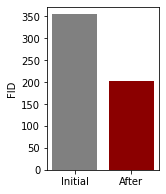

In [ ]:
print('Evaluating StyleGAN2  + DiffAugment (Initial)...')
fid_baseline = evaluate('/content/data-efficient-gans/DiffAugment-stylegan2/results/00000-DiffAugment-stylegan2-data_cleaned-64-batch16-1gpu-color-translation-cutout/network-snapshot-000000.pkl', dataset='/content/dataset/data_cleaned')
print('Initial FID:', fid_baseline, '\n')

print('Evaluating StyleGAN2 + DiffAugment (After)...')
fid_ours = evaluate('/content/data-efficient-gans/DiffAugment-stylegan2/results/00000-DiffAugment-stylegan2-data_cleaned-64-batch16-1gpu-color-translation-cutout/network-snapshot-000160.pkl', dataset='/content/dataset/data_cleaned')
print('After FID:', fid_ours, '\n')

plt.figure(figsize=(2, 3))
plt.bar([0, 1], [fid_baseline, fid_ours], color=['gray', 'darkred'])
plt.xticks([0, 1], ['Initial', 'After'])
plt.ylabel("FID")
plt.show()

### Generating an Interpolation Video

/content/data-efficient-gans/DiffAugment-stylegan2
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.


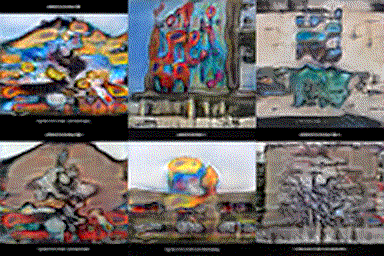

In [ ]:
%cd /content/data-efficient-gans/DiffAugment-stylegan2
!python3 generate_gif.py -r /content/data-efficient-gans/DiffAugment-stylegan2/results/00000-DiffAugment-stylegan2-data_cleaned-64-batch16-1gpu-color-translation-cutout/network-snapshot-000300.pkl -o interp.gif --num-rows=2 --num-cols=3 --seed=1
IPython.display.Image(open('interp.gif', 'rb').read())